Checking the GPU

In [ ]:

!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-98931f43-6e2d-624c-a10d-39a5811db2b4)


#Training

1.Mounting the Google Drive

In [1]:
from google.colab import drive
drive.mount('drive', force_remount=True)

ModuleNotFoundError: No module named 'google.colab'

2.Installing Tacotron2

In [ ]:

%matplotlib inline
import os
import io
%cd /content/
if not os.path.isdir("/content/TTS-TT2/"):
  print("Cloning justinjohn0306/TTS-TT2")
  !git clone https://github.com/justinjohn0306/ARPAtaco2.git TTS-TT2
  %cd /content/TTS-TT2/
  !git submodule init
  !git submodule update
%cd /content/TTS-TT2/

print("Downloading tacotron2 requirements")
!pip install matplotlib numpy inflect scipy Unidecode pillow
#Our requirements
#We'll need gdown to download some really cool things
!pip install git+https://github.com/wkentaro/gdown.git
import gdown
!git submodule init
!git submodule update
!pip install ffmpeg-normalize
!pip install -q unidecode tensorboardX
!apt-get -qq install sox
!apt-get install pv
!apt-get install jq
!wget https://raw.githubusercontent.com/tonikelope/megadown/master/megadown -O megadown.sh
!chmod 755 megadown.sh
#Download NVIDIA's LJSpeech model
# Download NVIDIA's LJSpeech model using wget
tt2_pretrained_url = "https://github.com/justinjohn0306/ARPAtaco2/releases/download/pretrained_model/tacotron2_statedict.pt"
tt2_pretrained_path = "/content/TTS-TT2/tacotron2_statedict.pt"

if not os.path.isfile(tt2_pretrained_path):
  print("Downloading tt2 pretrained model using wget")
  !wget {tt2_pretrained_url} -O {tt2_pretrained_path}


#tt2_pretrained = "https://drive.google.com/uc?id=1c5ZTuT7J08wLUoVZ2KkUs_VdZuJ86ZqA"
#if not os.path.isfile("/content/TTS-TT2/pretrained_model"):
  #print("Downloading tt2 pretrained")
  #gdown.download(tt2_pretrained, "/content/TTS-TT2/pretrained_model", quiet=False)

latest_downloaded = None

import time#measure duration
import logging#supress warning

logging.getLogger('matplotlib').setLevel(logging.WARNING)
logging.getLogger('numba').setLevel(logging.WARNING)
logging.getLogger('librosa').setLevel(logging.WARNING)


import argparse
import math
from numpy import finfo #limits for floating type

import torch
from distributed import apply_gradient_allreduce
import torch.distributed as dist
from torch.utils.data.distributed import DistributedSampler
from torch.utils.data import DataLoader#batching of data

from model import Tacotron2
from data_utils import TextMelLoader, TextMelCollate
from loss_function import Tacotron2Loss
from logger import Tacotron2Logger
from hparams import create_hparams

import random
import numpy as np

import layers
from utils import load_wav_to_torch, load_filepaths_and_text
from text import text_to_sequence
from math import e

from tqdm.notebook import tqdm # Modern Notebook TQDM adds progress bar
from distutils.dir_util import copy_tree
import matplotlib.pylab as plt

def download_from_google_drive(file_id, file_name):
  # download a file from the Google Drive link
  !rm -f ./cookie
  !curl -c ./cookie -s -L "https://drive.google.com/uc?export=download&id={file_id}" > /dev/null#discard output ko avoid cluter
  confirm_text = !awk '/download/ {print $NF}' ./cookie
  confirm_text = confirm_text[0]
  #Purpose: Google Drive may require a confirmation token to bypass its virus scanning warning for large files.
  #use previously save cookie and save as file name
  !curl -Lb ./cookie "https://drive.google.com/uc?export=download&confirm={confirm_text}&id={file_id}" -o {file_name}

#stft ko help le mel generate garxa audio file ko
def create_mels():
    print("Generating Mels")
    stft = layers.TacotronSTFT(
                hparams.filter_length, hparams.hop_length, hparams.win_length,
                hparams.n_mel_channels, hparams.sampling_rate, hparams.mel_fmin,
                hparams.mel_fmax)
    def save_mel(filename):
        audio, sampling_rate = load_wav_to_torch(filename)#loads and return sr
        if sampling_rate != stft.sampling_rate:
            raise ValueError("{} {} SR doesn't match target {} SR".format(filename,
                sampling_rate, stft.sampling_rate))
        audio_norm = audio / hparams.max_wav_value
        audio_norm = audio_norm.unsqueeze(0)
        audio_norm = torch.autograd.Variable(audio_norm, requires_grad=False)
        melspec = stft.mel_spectrogram(audio_norm)
        melspec = torch.squeeze(melspec, 0).cpu().numpy()
        np.save(filename.replace('.wav', ''), melspec)

    import glob
    wavs = glob.glob('wavs/*.wav')
    for i in tqdm(wavs):
        save_mel(i)


def reduce_tensor(tensor, n_gpus):
    rt = tensor.clone()#original tensor clone huna bata bachauxa
    dist.all_reduce(rt, op=dist.reduce_op.SUM)
    rt /= n_gpus
    return rt


def init_distributed(hparams, n_gpus, rank, group_name):
    assert torch.cuda.is_available(), "Distributed mode requires CUDA."
    print("Initializing Distributed")

    # Set cuda device so everything is done on the right GPU.
    torch.cuda.set_device(rank % torch.cuda.device_count())

    # Initialize distributed communication
    dist.init_process_group(
        backend=hparams.dist_backend, init_method=hparams.dist_url,
        world_size=n_gpus, rank=rank, group_name=group_name)

    print("Done initializing distributed")


def prepare_dataloaders(hparams):
    # Get data, data loaders and collate function ready
    trainset = TextMelLoader(hparams.training_files, hparams)
    valset = TextMelLoader(hparams.validation_files, hparams)
    collate_fn = TextMelCollate(hparams.n_frames_per_step)

    if hparams.distributed_run:
        train_sampler = DistributedSampler(trainset)
        shuffle = False
    else:
        train_sampler = None
        shuffle = True

    train_loader = DataLoader(trainset, num_workers=1, shuffle=shuffle,
                              sampler=train_sampler,
                              batch_size=hparams.batch_size, pin_memory=False,
                              drop_last=True, collate_fn=collate_fn)
    return train_loader, valset, collate_fn


def prepare_directories_and_logger(output_directory, log_directory, rank):
    if rank == 0:
        if not os.path.isdir(output_directory):
            os.makedirs(output_directory)
            os.chmod(output_directory, 0o775)
        logger = Tacotron2Logger(os.path.join(output_directory, log_directory))
    else:
        logger = None
    return logger


def load_model(hparams):
    model = Tacotron2(hparams).cuda()
    if hparams.fp16_run:
        model.decoder.attention_layer.score_mask_value = finfo('float16').min

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    return model


def warm_start_model(checkpoint_path, model, ignore_layers):
    assert os.path.isfile(checkpoint_path)
    print("Warm starting model from checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model_dict = checkpoint_dict['state_dict']
    if len(ignore_layers) > 0:
        model_dict = {k: v for k, v in model_dict.items()
                      if k not in ignore_layers}
        dummy_dict = model.state_dict()
        dummy_dict.update(model_dict)
        model_dict = dummy_dict
    model.load_state_dict(model_dict)
    return model


def load_checkpoint(checkpoint_path, model, optimizer):
    assert os.path.isfile(checkpoint_path)
    print("Loading checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model.load_state_dict(checkpoint_dict['state_dict'])
    optimizer.load_state_dict(checkpoint_dict['optimizer'])
    learning_rate = checkpoint_dict['learning_rate']
    iteration = checkpoint_dict['iteration']
    print("Loaded checkpoint '{}' from iteration {}" .format(
        checkpoint_path, iteration))
    return model, optimizer, learning_rate, iteration


def save_checkpoint(model, optimizer, learning_rate, iteration, filepath):
    import random
    if True:
        print("Saving model and optimizer state at iteration {} to {}".format(
            iteration, filepath))
        try:
            torch.save({'iteration': iteration,
                    'state_dict': model.state_dict(),
                    'optimizer': optimizer.state_dict(),
                    'learning_rate': learning_rate}, filepath)
        except KeyboardInterrupt:
            print("interrupt received while saving, waiting for save to complete.")
            torch.save({'iteration': iteration,'state_dict': model.state_dict(),'optimizer': optimizer.state_dict(),'learning_rate': learning_rate}, filepath)
        print("Model Saved")

def plot_alignment(alignment, info=None):
    %matplotlib inline
    fig, ax = plt.subplots(figsize=(int(alignment_graph_width/100), int(alignment_graph_height/100)))
    im = ax.imshow(alignment, cmap='inferno', aspect='auto', origin='lower',
                   interpolation='none')
    ax.autoscale(enable=True, axis="y", tight=True)
    fig.colorbar(im, ax=ax)
    xlabel = 'Decoder timestep'
    if info is not None:
        xlabel += '\n\n' + info
    plt.xlabel(xlabel)
    plt.ylabel('Encoder timestep')
    plt.tight_layout()
    fig.canvas.draw()
    plt.show()

def validate(model, criterion, valset, iteration, batch_size, n_gpus,
             collate_fn, logger, distributed_run, rank, epoch, start_eposh, learning_rate):
    """Handles all the validation scoring and printing"""
    model.eval()
    with torch.no_grad():
        val_sampler = DistributedSampler(valset) if distributed_run else None
        val_loader = DataLoader(valset, sampler=val_sampler, num_workers=1,
                                shuffle=False, batch_size=batch_size,
                                pin_memory=False, collate_fn=collate_fn)

        val_loss = 0.0
        for i, batch in enumerate(val_loader):
            x, y = model.parse_batch(batch)
            y_pred = model(x)
            loss = criterion(y_pred, y)
            if distributed_run:
                reduced_val_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_val_loss = loss.item()
            val_loss += reduced_val_loss
        val_loss = val_loss / (i + 1)

    model.train()
    if rank == 0:
        print("Epoch: {} Validation loss {}: {:9f}  Time: {:.1f}m LR: {:.6f}".format(epoch, iteration, val_loss,(time.perf_counter()-start_eposh)/60, learning_rate))
        logger.log_validation(val_loss, model, y, y_pred, iteration)
        if hparams.show_alignments:
            %matplotlib inline
            _, mel_outputs, gate_outputs, alignments = y_pred
            idx = random.randint(0, alignments.size(0) - 1)
            plot_alignment(alignments[idx].data.cpu().numpy().T)

def train(output_directory, log_directory, checkpoint_path, warm_start, n_gpus,
          rank, group_name, hparams, log_directory2, save_interval, backup_interval):
    """Training and validation logging results to tensorboard and stdout

    Params
    ------
    output_directory (string): directory to save checkpoints
    log_directory (string) directory to save tensorboard logs
    checkpoint_path(string): checkpoint path
    n_gpus (int): number of gpus
    rank (int): rank of current gpu
    hparams (object): comma separated list of "name=value" pairs.
    """
    if hparams.distributed_run:
        init_distributed(hparams, n_gpus, rank, group_name)
#consistent result ko lagii reproducibility across
    torch.manual_seed(hparams.seed)
    torch.cuda.manual_seed(hparams.seed)
#soptimezer set to adam optimizer
    model = load_model(hparams)
    learning_rate = hparams.learning_rate
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate,
                                 weight_decay=hparams.weight_decay)

    if hparams.fp16_run:
        from apex import amp
        model, optimizer = amp.initialize(
            model, optimizer, opt_level='O2')

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    criterion = Tacotron2Loss()

    logger = prepare_directories_and_logger(
        output_directory, log_directory, rank)
#c_fn for batching
    train_loader, valset, collate_fn = prepare_dataloaders(hparams)

    # Load checkpoint if one exists
    iteration = 0
    epoch_offset = 0
    if checkpoint_path is not None and os.path.isfile(checkpoint_path):
        warm_start=False
        if warm_start:
            model = warm_start_model(
                checkpoint_path, model, hparams.ignore_layers)
        else:
            model, optimizer, _learning_rate, iteration = load_checkpoint(
                checkpoint_path, model, optimizer)
            if hparams.use_saved_learning_rate:
                learning_rate = _learning_rate
            iteration += 1  # next iteration is iteration + 1
            epoch_offset = max(0, int(iteration / len(train_loader)))
    else:
      os.path.isfile("/content/TTS-TT2/pretrained_model")
      %cd /dev/null
      !/content/TTS-TT2/megadown.sh https://mega.nz/#!WXY3RILA!KyoGHtfB_sdhmLFoykG2lKWhh0GFdwMkk7OwAjpQHRo --o pretrained_model
      %cd /content/TTS-TT2
      model = warm_start_model("/content/TTS-TT2/pretrained_model", model, hparams.ignore_layers)
      # download LJSpeech pretrained model if no checkpoint already exists
#time for each epoch
    start_eposh = time.perf_counter()
    learning_rate = 0.0
    model.train()
    is_overflow = False
    # ================ MAIN TRAINNIG LOOP! ===================
    for epoch in tqdm(range(epoch_offset, hparams.epochs)):
        print("\nStarting Epoch: {} Iteration: {}".format(epoch, iteration))
        start_eposh = time.perf_counter() # eposh is russian, not a typo
        for i, batch in tqdm(enumerate(train_loader), total=len(train_loader)):
            start = time.perf_counter()
            if iteration < hparams.decay_start: learning_rate = hparams.A_
            else: iteration_adjusted = iteration - hparams.decay_start; learning_rate = (hparams.A_*(e**(-iteration_adjusted/hparams.B_))) + hparams.C_
            learning_rate = max(hparams.min_learning_rate, learning_rate) # output the largest number
            for param_group in optimizer.param_groups:
                param_group['lr'] = learning_rate
#remove previous gradients
            model.zero_grad()
            x, y = model.parse_batch(batch)
            y_pred = model(x)
#computes model output and the loss
            loss = criterion(y_pred, y)
            if hparams.distributed_run:
                reduced_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_loss = loss.item()
            if hparams.fp16_run:
                with amp.scale_loss(loss, optimizer) as scaled_loss:
                    scaled_loss.backward()
            else:
                loss.backward()

            if hparams.fp16_run:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    amp.master_params(optimizer), hparams.grad_clip_thresh)
                is_overflow = math.isnan(grad_norm)
            else:
                #Backpropagates the gradients and clips them to prevent exploding gradients.
#Updates the model parameters using the optimizer.
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    model.parameters(), hparams.grad_clip_thresh)

            optimizer.step()

            if not is_overflow and rank == 0:
                duration = time.perf_counter() - start
                
                #Logs training progress to TensorBoard.
#Saves checkpoints periodically based on save_interval.
                logger.log_training(
                    reduced_loss, grad_norm, learning_rate, duration, iteration)
                #print("Batch {} loss {:.6f} Grad Norm {:.6f} Time {:.6f}".format(iteration, reduced_loss, grad_norm, duration), end='\r', flush=True)

            iteration += 1
            
        validate(model, criterion, valset, iteration,
                 hparams.batch_size, n_gpus, collate_fn, logger,
                 hparams.distributed_run, rank, epoch, start_eposh, learning_rate)
        if (epoch+1) % save_interval == 0 or (epoch+1) == hparams.epochs: # not sure if the latter is necessary
            save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path)
        if backup_interval > 0 and (epoch+1) % backup_interval == 0:
            save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path + "_epoch_%s" % (epoch+1))
        if log_directory2 != None:
            copy_tree(log_directory, log_directory2)
            
            #data integrity check of training and validation
def check_dataset(hparams):
    from utils import load_wav_to_torch, load_filepaths_and_text
    import os
    import numpy as np
    def check_arr(filelist_arr):
        for i, file in enumerate(filelist_arr):
            if len(file) > 2:
                print("|".join(file), "\nhas multiple '|', this may not be an error.")
            if hparams.load_mel_from_disk and '.wav' in file[0]:
                print("[WARNING]", file[0], " in filelist while expecting .npy .")
            else:
                if not hparams.load_mel_from_disk and '.npy' in file[0]:
                    print("[WARNING]", file[0], " in filelist while expecting .wav .")
            if (not os.path.exists(file[0])):
                print("|".join(file), "\n[WARNING] does not exist.")
            if len(file[1]) < 3:
                print("|".join(file), "\n[info] has no/very little text.")
            if not ((file[1].strip())[-1] in r"!?,.;:"):
                print("|".join(file), "\n[info] has no ending punctuation.")
            mel_length = 1
            if hparams.load_mel_from_disk and '.npy' in file[0]:
                melspec = torch.from_numpy(np.load(file[0], allow_pickle=True))
                mel_length = melspec.shape[1]
            if mel_length == 0:
                print("|".join(file), "\n[WARNING] has 0 duration.")
    print("Checking Training Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.training_files) # get split lines from training_files text file.
    check_arr(audiopaths_and_text)
    print("Checking Validation Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.validation_files) # get split lines from validation_files text file.
    check_arr(audiopaths_and_text)
    print("Finished Checking")

warm_start=False
n_gpus=1
rank=0
group_name=None

# ---- DEFAULT PARAMETERS DEFINED HERE ----
hparams = create_hparams()
model_filename = 'current_model'
hparams.training_files = "filelists/clipper_train_filelist.txt"
hparams.validation_files = "filelists/clipper_val_filelist.txt"
#hparams.use_mmi=True,          # not used in this notebook
#hparams.use_gaf=True,          # not used in this notebook
#hparams.max_gaf=0.5,           # not used in this notebook
#hparams.drop_frame_rate = 0.2  # not used in this notebook
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1
hparams.decay_start = 15000
hparams.A_ = 5e-4
hparams.B_ = 8000
hparams.C_ = 0
hparams.min_learning_rate = 1e-5
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000
hparams.batch_size = 32
hparams.load_mel_from_disk = True
hparams.ignore_layers = []
hparams.epochs = 10000
torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark
output_directory = '/content/drive/My Drive/colab/outdir' # Location to save Checkpoints
log_directory = '/content/TTS-TT2/logs' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename

# ---- Replace .wav with .npy in filelists ----
!sed -i -- 's,.wav|,.npy|,g' filelists/*.txt
!sed -i -- 's,.wav|,.npy|,g' {hparams.training_files}
!sed -i -- 's,.wav|,.npy|,g' {hparams.validation_files}
# ---- Replace .wav with .npy in filelists ----

%cd /content/TTS-TT2

data_path = 'wavs'
!mkdir {data_path}

[WinError 2] The system cannot find the file specified: '/content/'
d:\
Cloning justinjohn0306/TTS-TT2


d:\Project\text_to_speech\Lib\site-packages\IPython\core\magics\osm.py:393: UserWarning: This is now an optional IPython functionality, using bookmarks requires you to install the `pickleshare` library.
  bkms = self.shell.db.get('bookmarks', {})


[WinError 3] The system cannot find the path specified: '/content/TTS-TT2/'
d:\


Cloning into 'TTS-TT2'...


^C


fatal: not a git repository (or any of the parent directories): .git


[WinError 3] The system cannot find the path specified: '/content/TTS-TT2/'
d:\


fatal: not a git repository (or any of the parent directories): .git


  Running command git clone --filter=blob:none --quiet https://github.com/wkentaro/gdown.git 'C:\Users\Albin\AppData\Local\Temp\pip-req-build-5k44ez9a'


  Cloning https://github.com/wkentaro/gdown.git to c:\users\albin\appdata\local\temp\pip-req-build-5k44ez9a
  Resolved https://github.com/wkentaro/gdown.git to commit eeb6995f2e077991576b35956983bbefe34cf057
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


fatal: not a git repository (or any of the parent directories): .git
fatal: not a git repository (or any of the parent directories): .git


'apt-get' is not recognized as an internal or external command,
operable program or batch file.
'apt-get' is not recognized as an internal or external command,
operable program or batch file.
'apt-get' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


'chmod' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


ModuleNotFoundError: No module named 'distributed'

3.Loading the Dataset

In [ ]:

audio_processing = True 
drive_path = "/content/drive/MyDrive/wavs.zip" 

from google.colab import files
import zipfile
import os
import wave
import shutil
import datetime

if os.listdir('/content/TTS-TT2/wavs/'):
  !rm /content/TTS-TT2/wavs/*

with open('/content/audios.sh', 'w') as rsh:
    rsh.write('''\
for file in /content/TTS-TT2/wavs/*.wav
do
    ffmpeg -y -i "$file" -ar 22050 /content/tempwav/srtmp.wav -loglevel error
    ffmpeg -y -i /content/tempwav/srtmp.wav -c copy -fflags +bitexact -flags:v +bitexact -flags:a +bitexact -ar 22050 /content/tempwav/poop.wav -loglevel error
    rm "$file"
    mv /content/tempwav/poop.wav "$file"
    rm /content/tempwav/*
done
''')

%cd /content/TTS-TT2/wavs

drive_path = drive_path.strip()

#zip bhaye extract garera rakhne wavs ma else copy directly
if drive_path:
  if os.path.exists(drive_path):
    print(f"\n\033[34m\033[1mAudio imported from Drive.\n\033[90m")
    if zipfile.is_zipfile(drive_path):
      !unzip -q -j "$drive_path" -d /content/TTS-TT2/wavs

    else:
      fp = drive_path + "/."
      !cp -a "$fp" "/content/TTS-TT2/wavs"
  else:
    print(f"\n\033[33m\033[1m[NOTICE] The path {drive_path} is not found, check for errors and try again.")
    print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
    uploaded = files.upload()
else:
  print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
  uploaded = files.upload()
#extract gareko
  for fn in uploaded.keys():
    if zipfile.is_zipfile(fn):
      !unzip -q -j "$fn" -d /content/TTS-TT2/wavs
      !rm "$fn"
#nested wavs bata wavs ma lageko
if os.path.exists("/content/TTS-TT2/wavs/wavs"):
    for file in os.listdir("/content/TTS-TT2/wavs/wavs"):
      !mv /content/TTS-TT2/wavs/wavs/"$file"  /content/TTS-TT2/wavs/"$file"
!rm /content/TTS-TT2/wavs/list.txt
if audio_processing:
  print(f"\n\033[37mMetadata removal and audio verification...")
  !mkdir /content/tempwav
 # !bash /content/audios.sh
 
#12 sec bhanda lamo audi warn garxa
totalduration = 0
for file_name in [x for x in os.listdir() if os.path.isfile(x)]:
    with wave.open(file_name, "rb") as wave_file:
        frames = wave_file.getnframes()
        rate = wave_file.getframerate()
        duration = frames / float(rate)
        totalduration += duration

        if duration >= 12:
          print(f"\n\033[33m\033[1m[NOTICE] {file_name} is longer than 12 seconds. Lack of RAM can"
                " occur in a large batch size!")

wav_count = len(os.listdir("/content/TTS-TT2/wavs"))
print(f"\n{wav_count} processed audios. total duration: {str(datetime.timedelta(seconds=round(totalduration, 0)))}\n")

#shutil.make_archive("/content/processedwavs", 'zip', '/content/TTS-TT2/wavs')
#files.download('/content/processedwavs.zip')

print("\n\033[32m\033[1mAll set, please proceed.")

/content/TTS-TT2/wavs

Audio imported from Drive.

rm: cannot remove '/content/TTS-TT2/wavs/list.txt': No such file or directory

Metadata removal and audio verification...

13100 processed audios. total duration: 23:16:23


All set, please proceed.


4.Uploading a transcript in UTF-8 without BOM

In [ ]:
from google.colab import files
import os

%cd /content/TTS-TT2/filelists/
!rm /content/TTS-TT2/filelists/list.txt

print("\n\033[34m\033[1mUpload your transcript(list)...")
listfn, length = files.upload().popitem()
#renaming
if listfn != "list.txt":
  !mv "$listfn" list.txt


with open('list.txt', 'r') as f:
    lines = f.readlines()


new_lines = []
for line in lines:
    audio_file_path = '/content/TTS-TT2/' + line.split('|')[0]

    if os.path.exists(audio_file_path):
        new_lines.append(line)


with open('list.txt', 'w') as f:
    f.writelines(new_lines)

%cd /content/TTS-TT2/
print("\n\033[32m\033[1mAll set, please proceed.")

/content/TTS-TT2/filelists
rm: cannot remove '/content/TTS-TT2/filelists/list.txt': No such file or directory

Upload your transcript(list)...


Saving list.txt to list.txt
/content/TTS-TT2

All set, please proceed.


5.seprate trainval test

In [ ]:
import os
from sklearn.model_selection import train_test_split

# Define paths
input_file = "/content/TTS-TT2/filelists/list.txt"
train_file = "/content/TTS-TT2/filelists/train.txt"
val_file = "/content/TTS-TT2/filelists/val.txt"
test_file = "/content/TTS-TT2/filelists/test.txt"

# Check if input file exists and has content
if not os.path.exists(input_file):
    raise FileNotFoundError(f"Input file {input_file} not found.")

with open(input_file, "r") as f:
    lines = f.readlines()

if not lines:
    raise ValueError("Input file is empty. Please provide a non-empty list.txt file.")

# First split: 80% train, 20% temp (val + test)
train_lines, temp_lines = train_test_split(lines, test_size=0.2, random_state=42)

# Second split on the 20% temp data: 10% val, 10% test (50% of temp each)
val_lines, test_lines = train_test_split(temp_lines, test_size=0.5, random_state=42)

# Write to train.txt, val.txt, and test.txt
with open(train_file, "w") as f_train:
    f_train.writelines(train_lines)

with open(val_file, "w") as f_val:
    f_val.writelines(val_lines)

with open(test_file, "w") as f_test:
    f_test.writelines(test_lines)

# Update hparams to use new training, validation, and test files
hparams.training_files = train_file
hparams.validation_files = val_file
hparams.test_files = test_file  # add a test_files parameter if needed

print(f"Data split complete. Training data saved to {train_file}, validation data saved to {val_file}, test data saved to {test_file}.")


Data split complete. Training data saved to /content/TTS-TT2/filelists/train.txt, validation data saved to /content/TTS-TT2/filelists/val.txt, test data saved to /content/TTS-TT2/filelists/test.txt.


6. Configure model


In [ ]:
model_filename = 'Text_To_Speech' 
Training_file = "/content/TTS-TT2/filelists/train.txt" 
Validation_file= "/content/TTS-TT2/filelists/val.txt" 
hparams.training_files = Training_file
hparams.validation_files = Validation_file
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1
# Learning Rate             
hparams.decay_start = 15000         # wait till decay_start to start decaying learning rate
#### Lower learning rates will take more time but will lead to more accurate results:
# Start/Max Learning Rate
hparams.A_ = 3e-6 
hparams.B_ = 8000                   # Decay Rate
hparams.C_ = 0                      # Shift learning rate equation by this value kasari effect garxa
hparams.min_learning_rate = 1e-5    # Min Learning Rate
# Quality of Life
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000
hparams.batch_size =  30
hparams.load_mel_from_disk = True
hparams.ignore_layers = [] 
#use cmudict dictionary to map text to phonemes
use_cmudict = True 
 #### Amount of epochs before stopping, preferably a very high amount to not stop.
hparams.epochs =  150
torch.backends.cudnn.enabled = hparams.cudnn_enabled#speecd up training
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark#select best algo for gpu
 #### Where to save your model when training:
output_directory = '/content/drive/MyDrive/colab/outdir' 
log_directory = '/content/TTS-TT2/logs' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename
#### Train the model from scratch? 
warm_start=False 
hparams.text_cleaners=["english_cleaners"] + (["cmudict_cleaners"] if use_cmudict is True else [])







7.Convert .wav files to Melspectrograms

In [ ]:
if generate_mels:
    create_mels()

print("Checking for missing files")
# ---- stream editor toolReplace .wav with .npy in filelists ----
!sed -i -- 's,.wav|,.npy|,g' {hparams.training_files}; sed -i -- 's,.wav|,.npy|,g' {hparams.validation_files}

check_dataset(hparams)

Generating Mels


  0%|          | 0/13100 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
/content/TTS-TT2/wavs/4034.npy|NEVERTHELESS IN THIS POSITION THROUGH THE CULPABLE CARELESSNESS WHICH LEFT HIM UNFETTERED HE MANAGED BETWEEN EIGHTEEN FORTY FOUR 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/11247.npy|A PLACEMENT INTERVIEWER OF THE LOUISIANA DEPARTMENT OF LABOR 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/1249.npy|THERE WERE TREAD WHEELS AT MOST OF THE PRISONS AND REGULAR EMPLOYMENT THEREON OR AT SOME OTHER KIND OF HARD LABOUR 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/2193.npy|THE FORMER ALREADY VOWED TO THE SAME CRIMINAL CAREER AND LOOKING UP TO THEIR ELDERS WITH THE RESPECT DUE TO SUCCESSFUL PRACTITIONERS 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/2713.npy|THE GOVERNMENT WERE PROBABLY NOT PROUD OF THEIR AGENT FOR EDWARDS AFTER THE CONVICTION HAD BEEN ASSURED WENT ABROAD TO ENJOY IT WAS SAID 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/9185.npy|STANDING ALO

8.Check the working cmudict patch

In [ ]:
#check if it is converted to sequence of token whivh will be processed #seq to text le human readable ma lyauxa
%cd /content/TTS-TT2/
import text
print(text.sequence_to_text(text.text_to_sequence("We must capture an Earth creature, K 9, and return it back with us to Mars.", ["cmudict_cleaners", "english_cleaners"])))

/content/TTS-TT2
{W IY1} {M AH1 S T} {K AE1 P CH ER0} {AE1 N} {ER1 TH} {K R IY1 CH ER0} , {K EY1} nine , {AH0 N D} {R IH0 T ER1 N} {IH1 T} {B AE1 K} {W IH1 DH} {AH1 S} {T UW1} {M AA1 R Z} .


9. Beginining of training

In [29]:
import torch
torch.cuda.empty_cache()


In [30]:
import gc
gc.collect()

26748

FP16 Run: False
Dynamic Loss Scaling: True
Distributed Run: False
cuDNN Enabled: True
cuDNN Benchmark: False
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

[Errno 20] Not a directory: '/dev/null'
/content/TTS-TT2

Reading link metadata...


/content/TTS-TT2
Warm starting model from checkpoint '/content/TTS-TT2/pretrained_model'


<ipython-input-10-40a44844ee42>:183: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')


  0%|          | 0/150 [00:00<?, ?it/s]


Starting Epoch: 0 Iteration: 0


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 0 Validation loss 349:  0.257002  Time: 20.7m LR: 0.000010


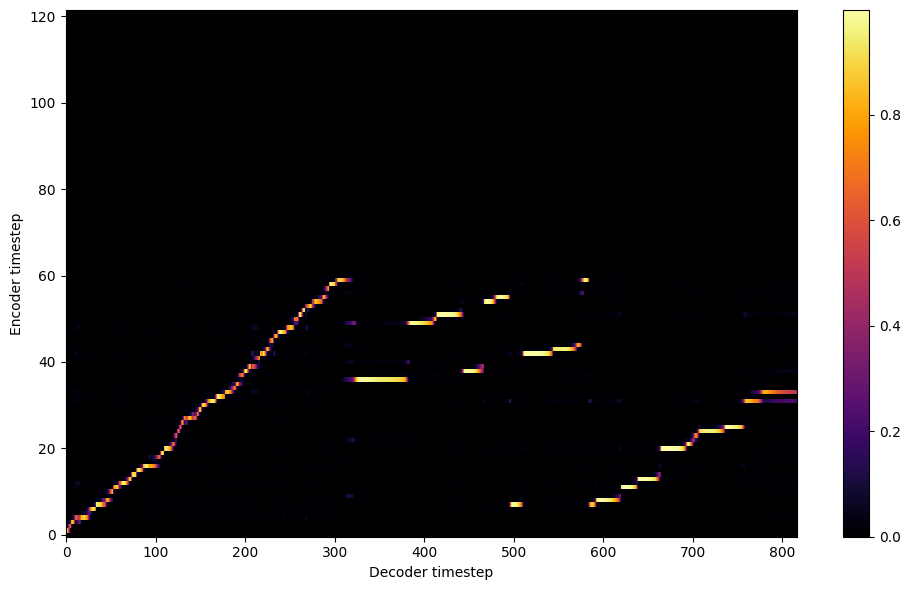

Saving model and optimizer state at iteration 349 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 1 Iteration: 349


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 1 Validation loss 698:  0.253404  Time: 20.7m LR: 0.000010


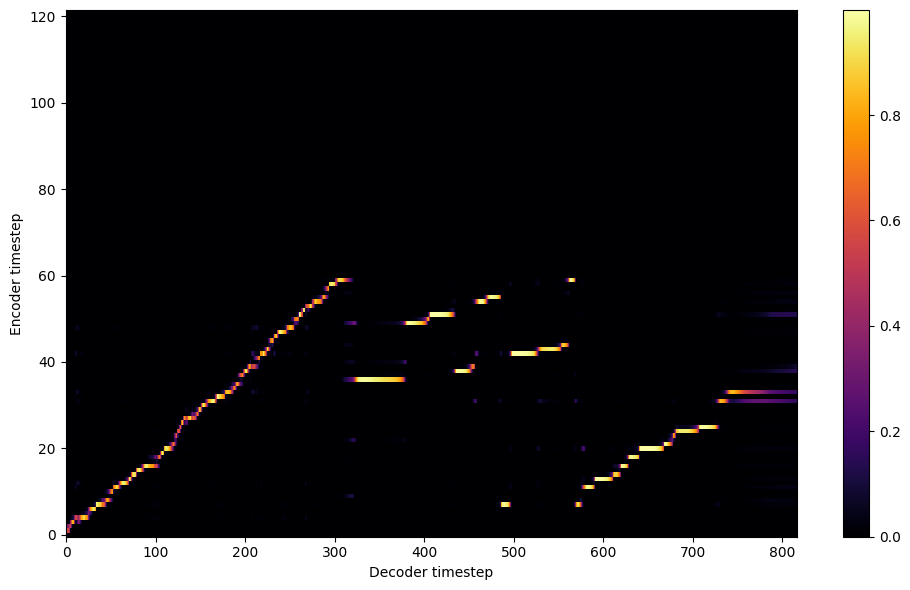

Saving model and optimizer state at iteration 698 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 2 Iteration: 698


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 2 Validation loss 1047:  0.251994  Time: 20.6m LR: 0.000010


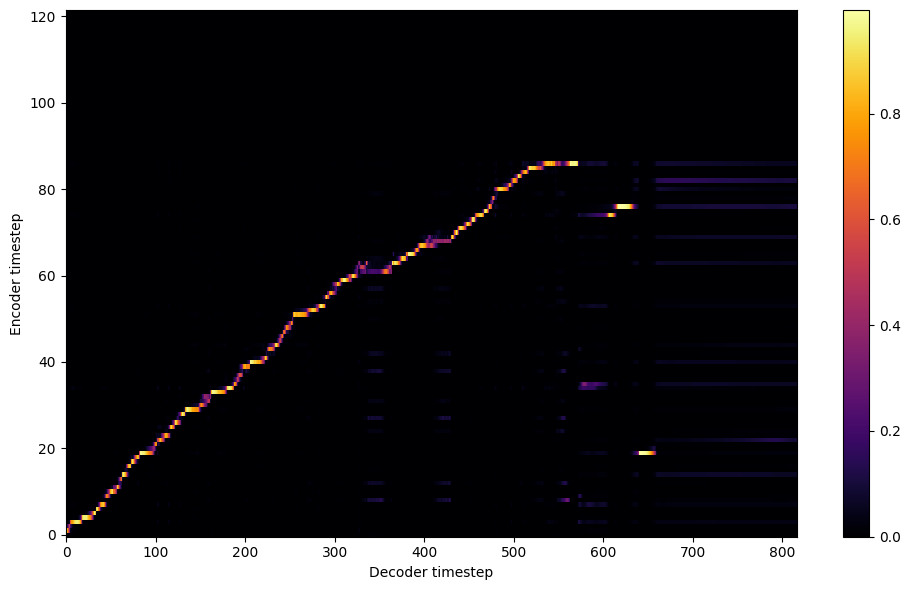

Saving model and optimizer state at iteration 1047 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 3 Iteration: 1047


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 3 Validation loss 1396:  0.251249  Time: 20.6m LR: 0.000010


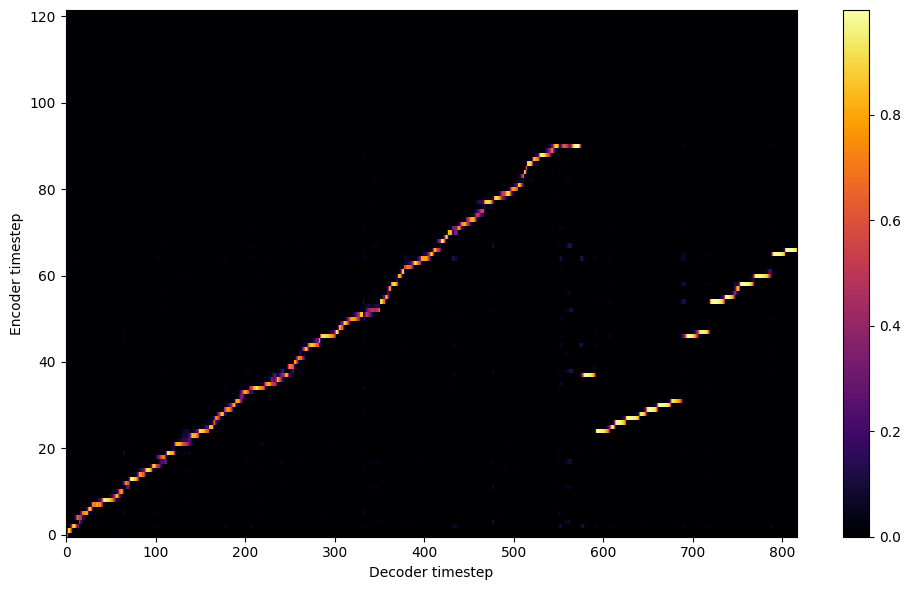

Saving model and optimizer state at iteration 1396 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 4 Iteration: 1396


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 4 Validation loss 1745:  0.250434  Time: 20.6m LR: 0.000010


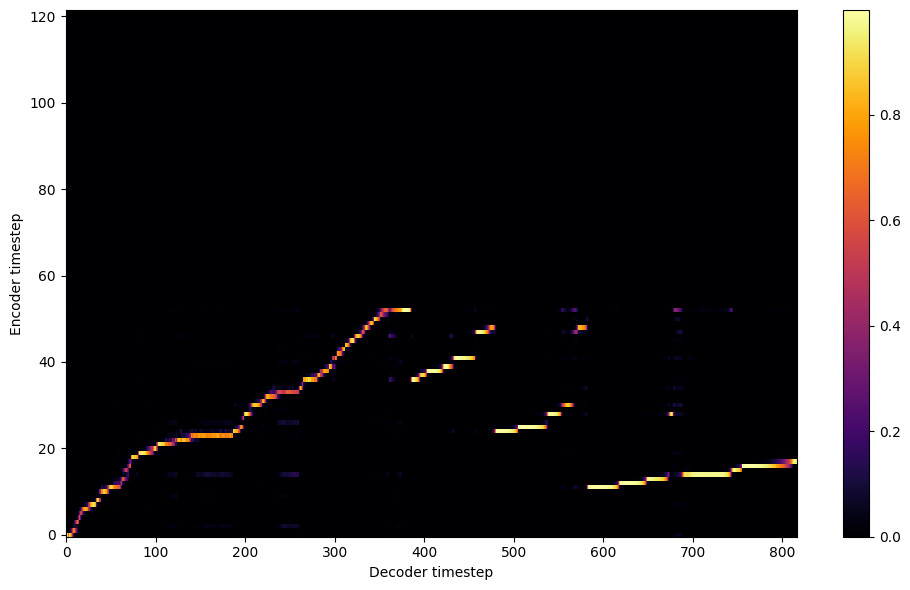

Saving model and optimizer state at iteration 1745 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 5 Iteration: 1745


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 5 Validation loss 2094:  0.249911  Time: 20.6m LR: 0.000010


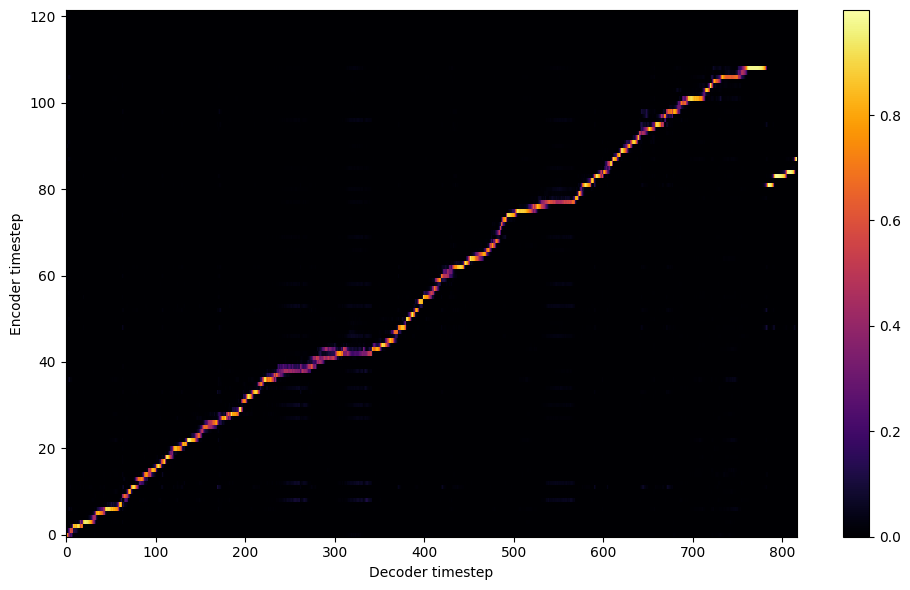

Saving model and optimizer state at iteration 2094 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 6 Iteration: 2094


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 6 Validation loss 2443:  0.249270  Time: 20.6m LR: 0.000010


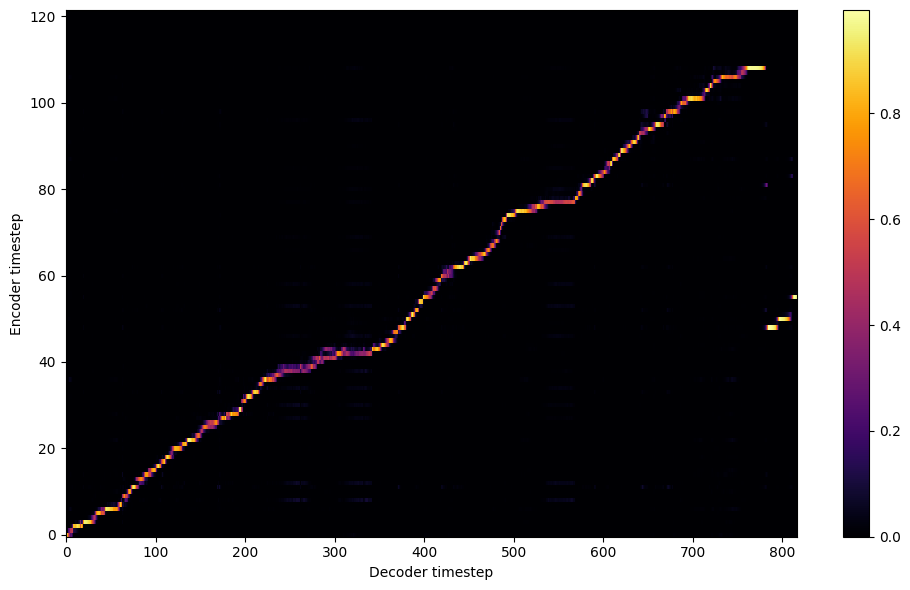

Saving model and optimizer state at iteration 2443 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 7 Iteration: 2443


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 7 Validation loss 2792:  0.249784  Time: 20.6m LR: 0.000010


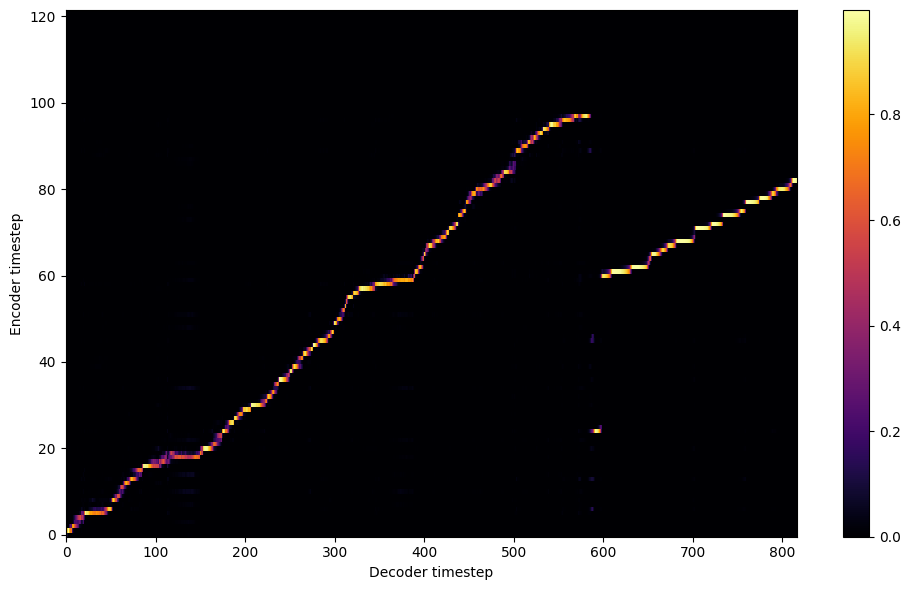

Saving model and optimizer state at iteration 2792 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 8 Iteration: 2792


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 8 Validation loss 3141:  0.249023  Time: 20.6m LR: 0.000010


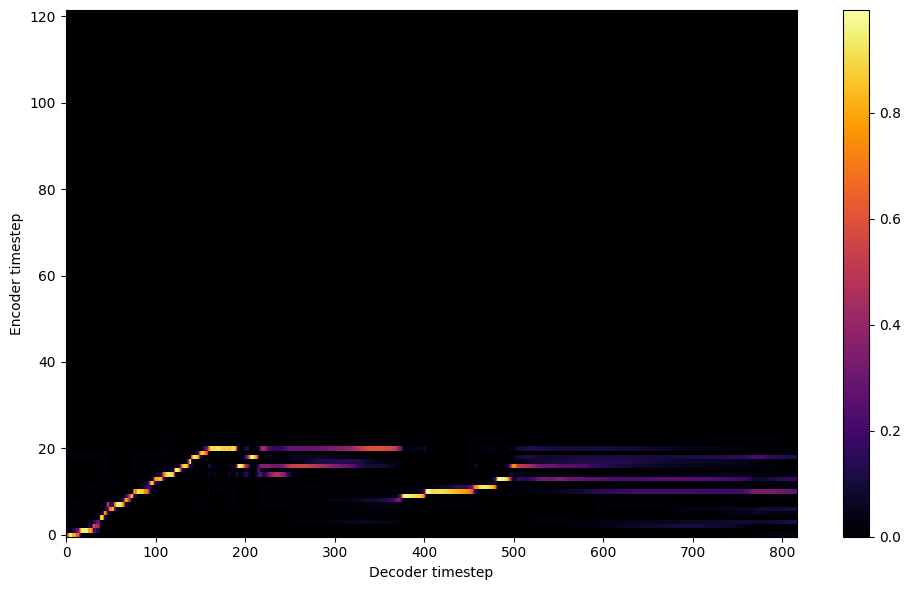

Saving model and optimizer state at iteration 3141 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 9 Iteration: 3141


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 9 Validation loss 3490:  0.248967  Time: 20.7m LR: 0.000010


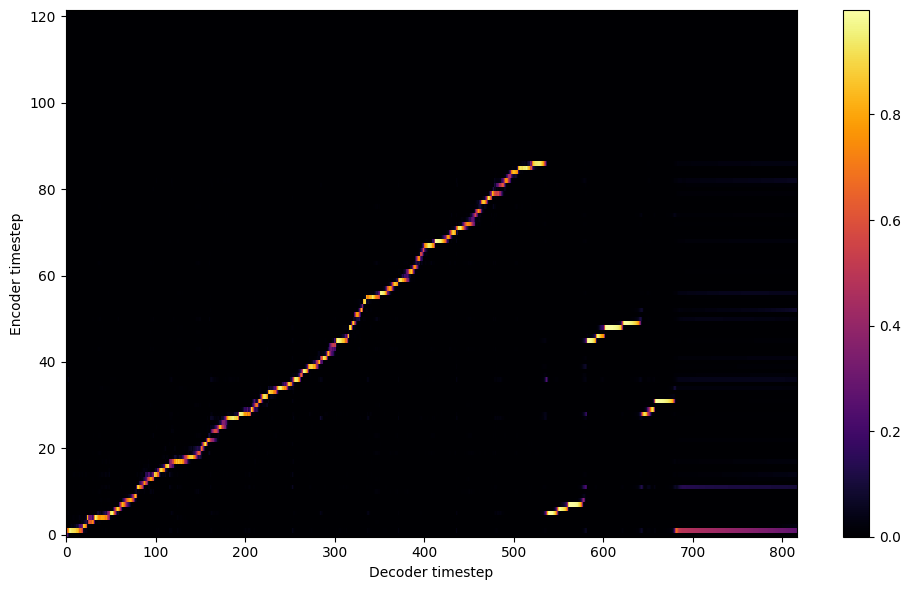

Saving model and optimizer state at iteration 3490 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 10 Iteration: 3490


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 10 Validation loss 3839:  0.248719  Time: 20.6m LR: 0.000010


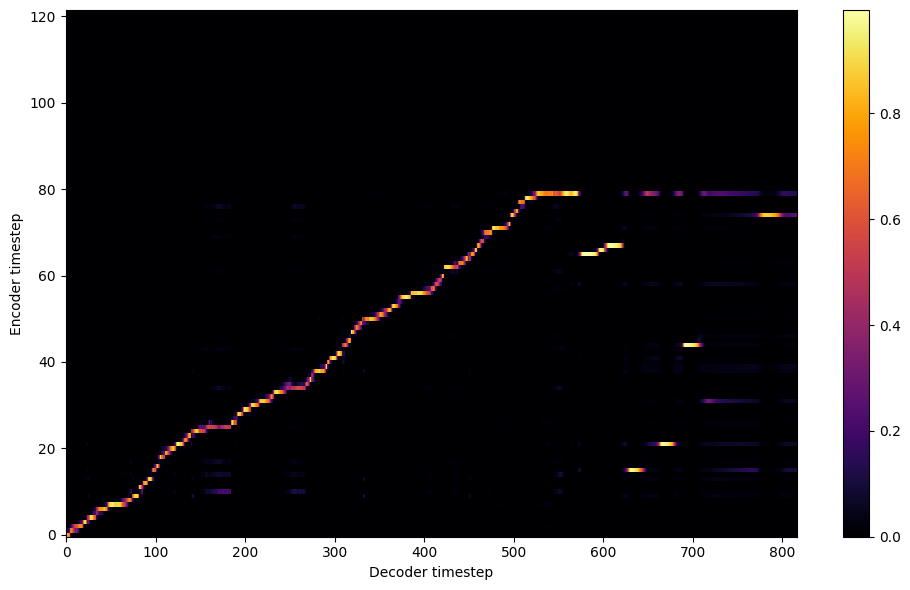

Saving model and optimizer state at iteration 3839 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 11 Iteration: 3839


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 11 Validation loss 4188:  0.248430  Time: 20.7m LR: 0.000010


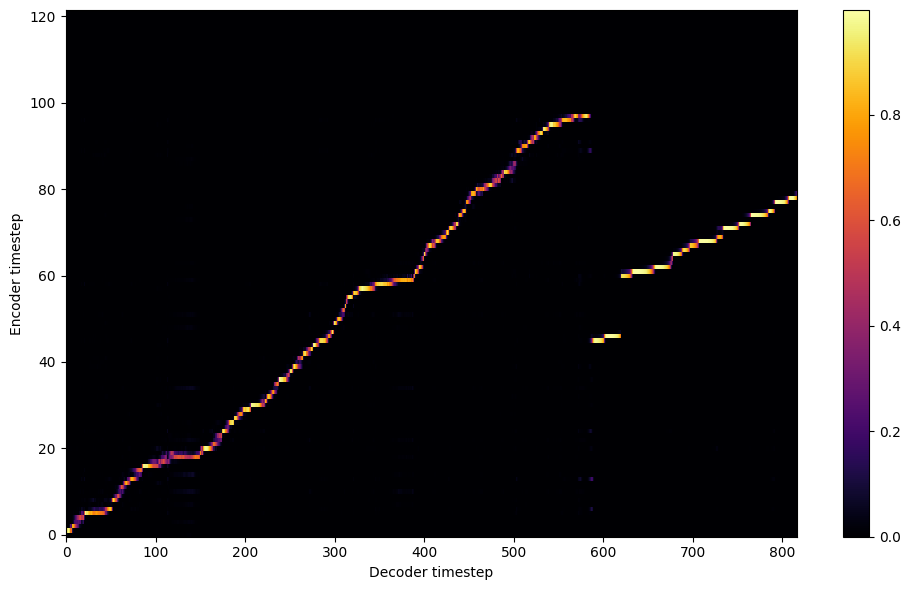

Saving model and optimizer state at iteration 4188 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 12 Iteration: 4188


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 12 Validation loss 4537:  0.248259  Time: 20.7m LR: 0.000010


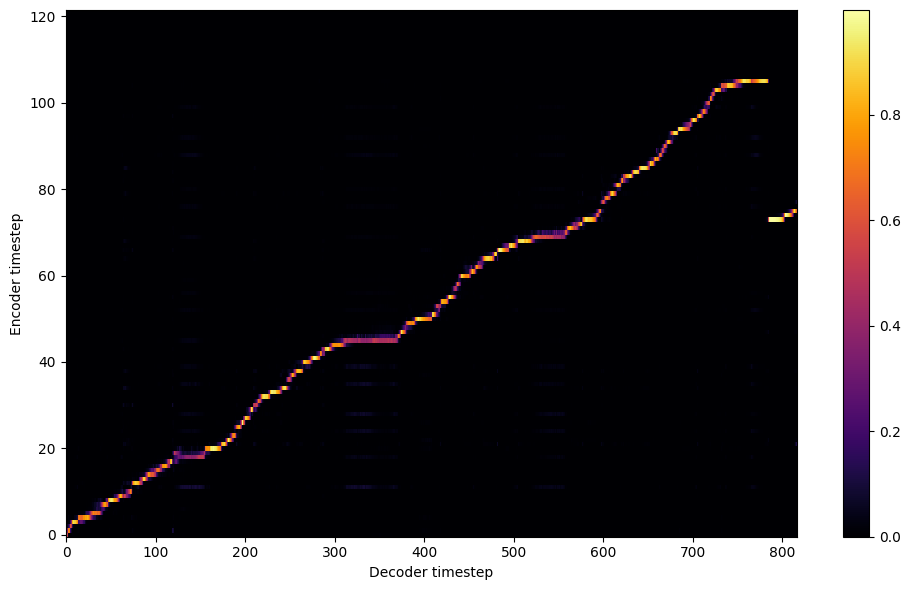

Saving model and optimizer state at iteration 4537 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 13 Iteration: 4537


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 13 Validation loss 4886:  0.248285  Time: 20.6m LR: 0.000010


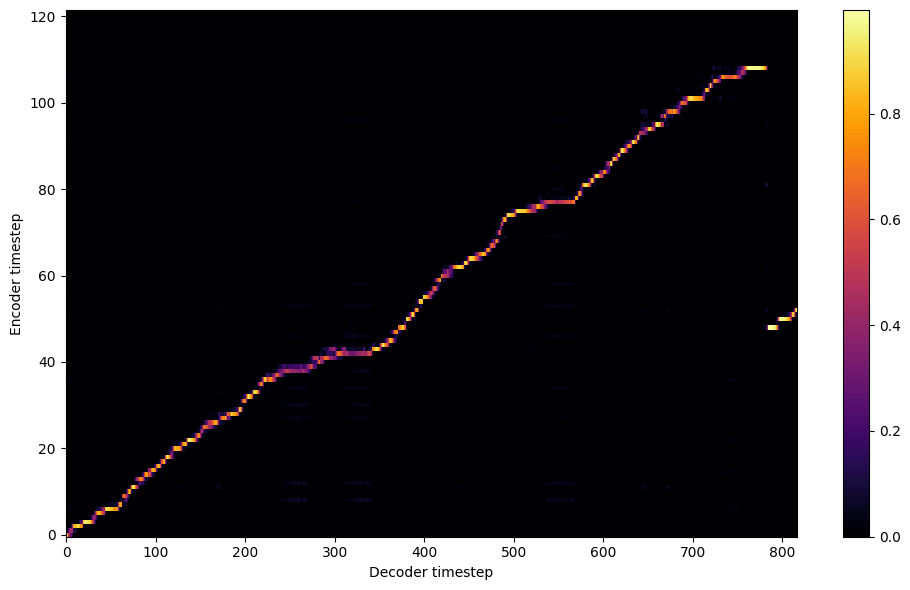

Saving model and optimizer state at iteration 4886 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 14 Iteration: 4886


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 14 Validation loss 5235:  0.247721  Time: 20.6m LR: 0.000010


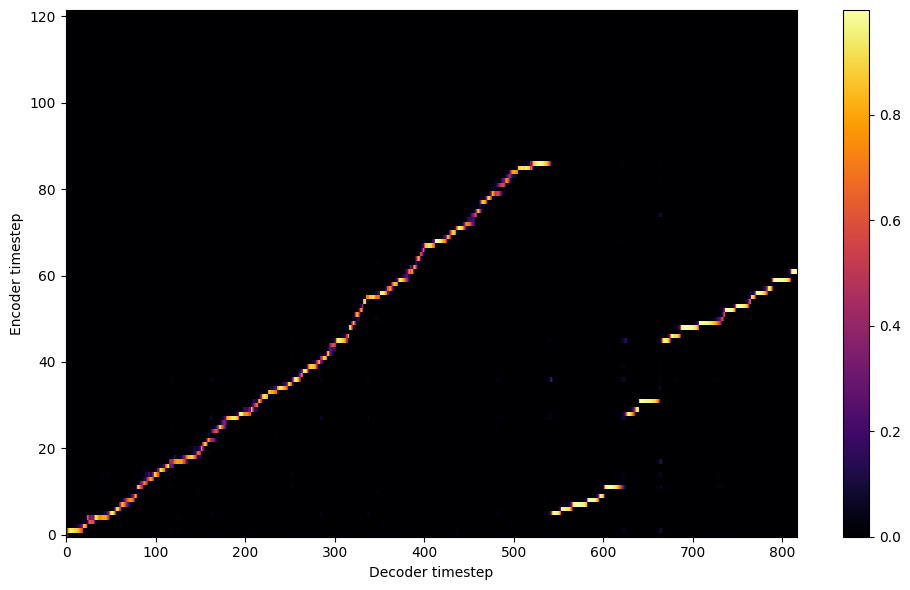

Saving model and optimizer state at iteration 5235 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 15 Iteration: 5235


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 15 Validation loss 5584:  0.248076  Time: 20.5m LR: 0.000010


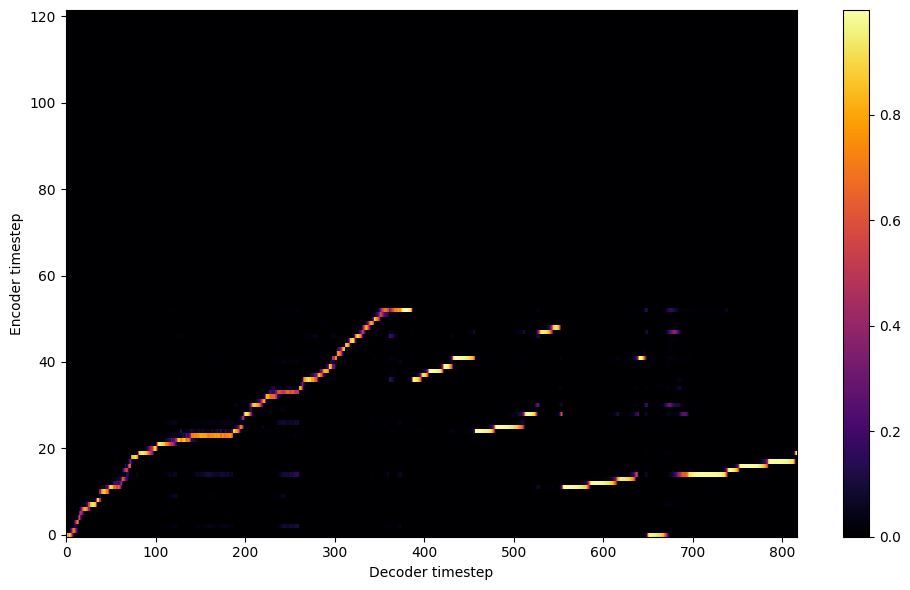

Saving model and optimizer state at iteration 5584 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 16 Iteration: 5584


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 16 Validation loss 5933:  0.248048  Time: 20.5m LR: 0.000010


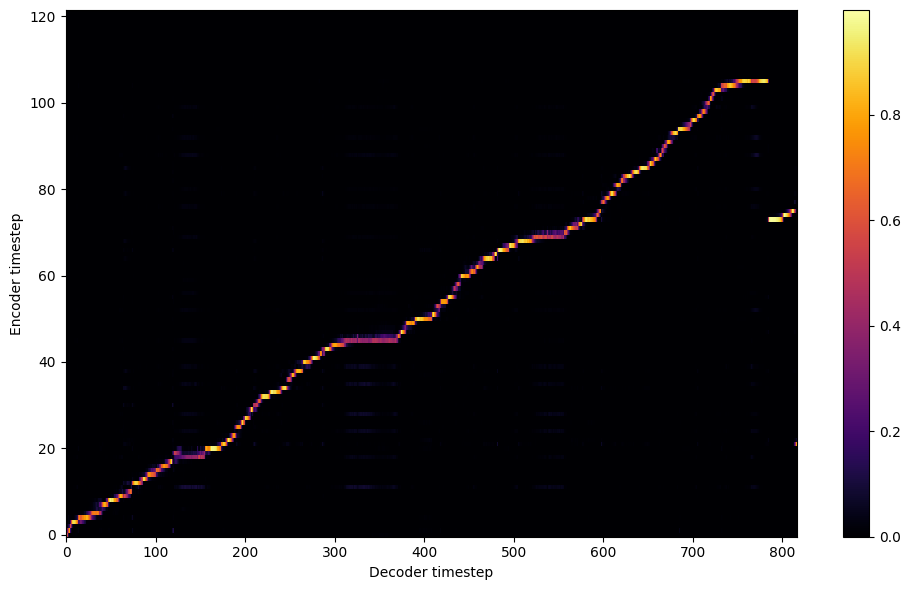

Saving model and optimizer state at iteration 5933 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 17 Iteration: 5933


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 17 Validation loss 6282:  0.247505  Time: 20.5m LR: 0.000010


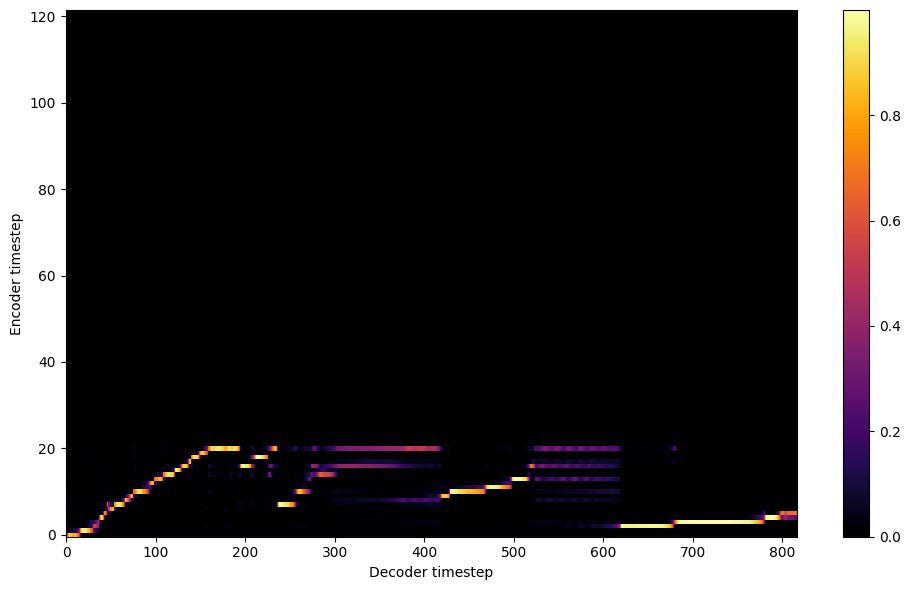

Saving model and optimizer state at iteration 6282 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 18 Iteration: 6282


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 18 Validation loss 6631:  0.247499  Time: 20.6m LR: 0.000010


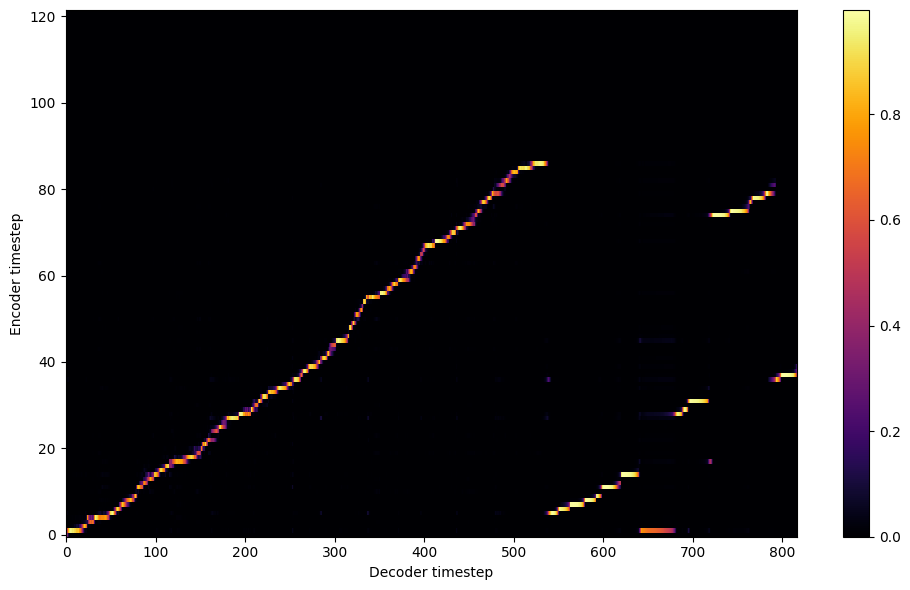

Saving model and optimizer state at iteration 6631 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 19 Iteration: 6631


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 19 Validation loss 6980:  0.247841  Time: 20.6m LR: 0.000010


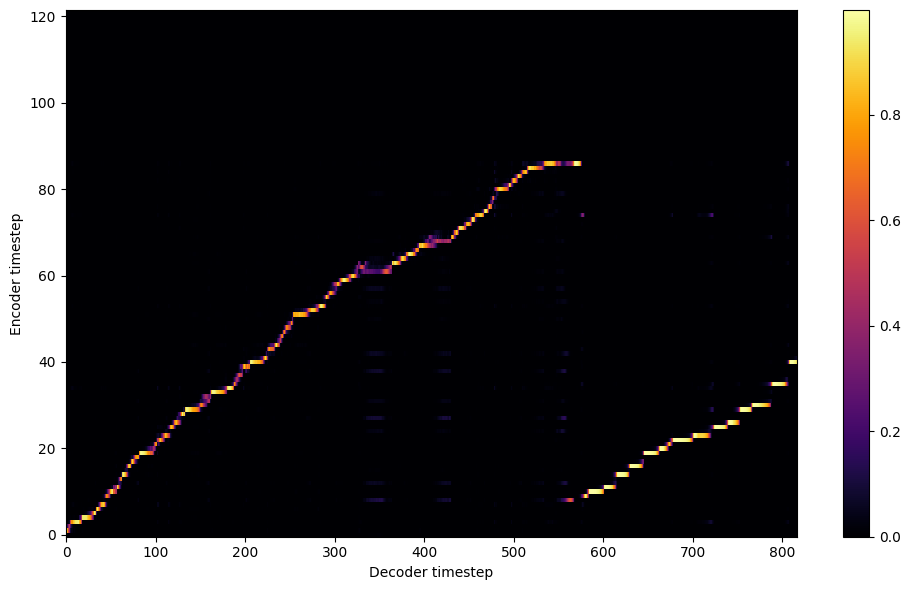

Saving model and optimizer state at iteration 6980 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 20 Iteration: 6980


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 20 Validation loss 7329:  0.247826  Time: 20.6m LR: 0.000010


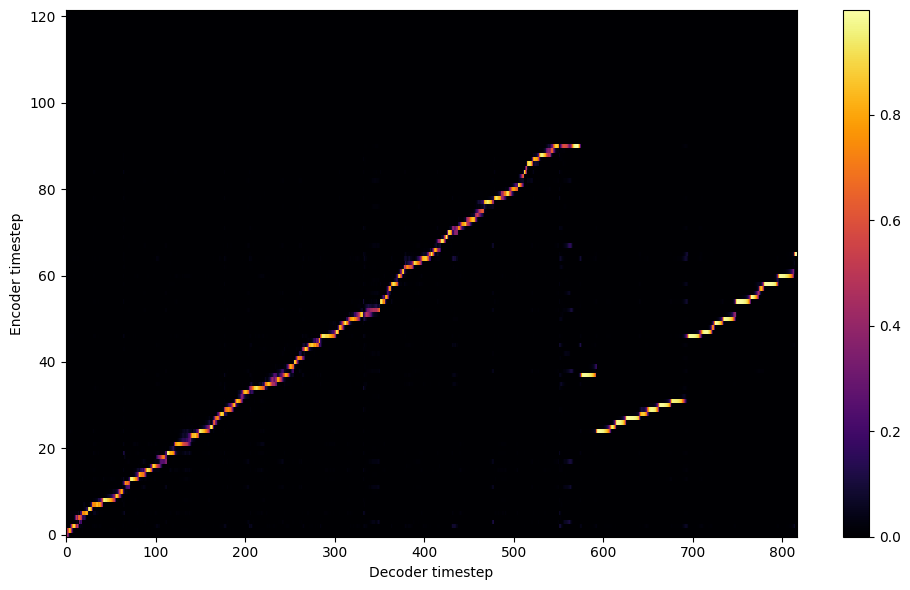

Saving model and optimizer state at iteration 7329 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 21 Iteration: 7329


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 21 Validation loss 7678:  0.247591  Time: 20.6m LR: 0.000010


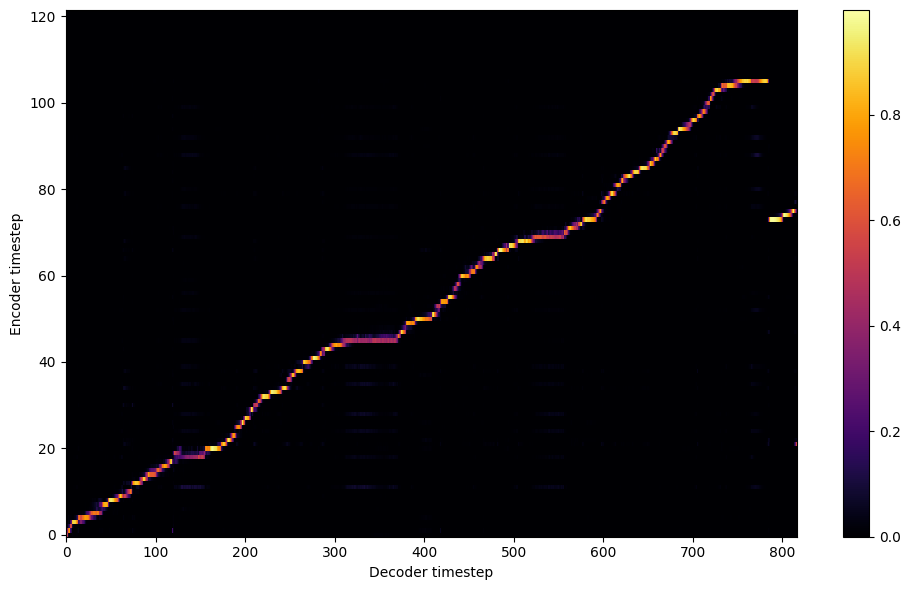

Saving model and optimizer state at iteration 7678 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 22 Iteration: 7678


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 22 Validation loss 8027:  0.247517  Time: 20.6m LR: 0.000010


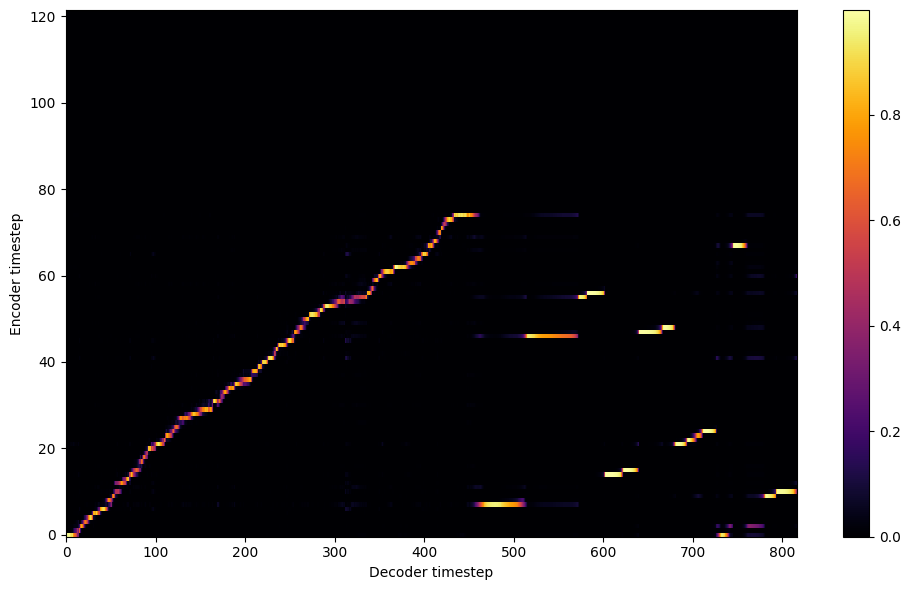

Saving model and optimizer state at iteration 8027 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 23 Iteration: 8027


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 23 Validation loss 8376:  0.247482  Time: 20.5m LR: 0.000010


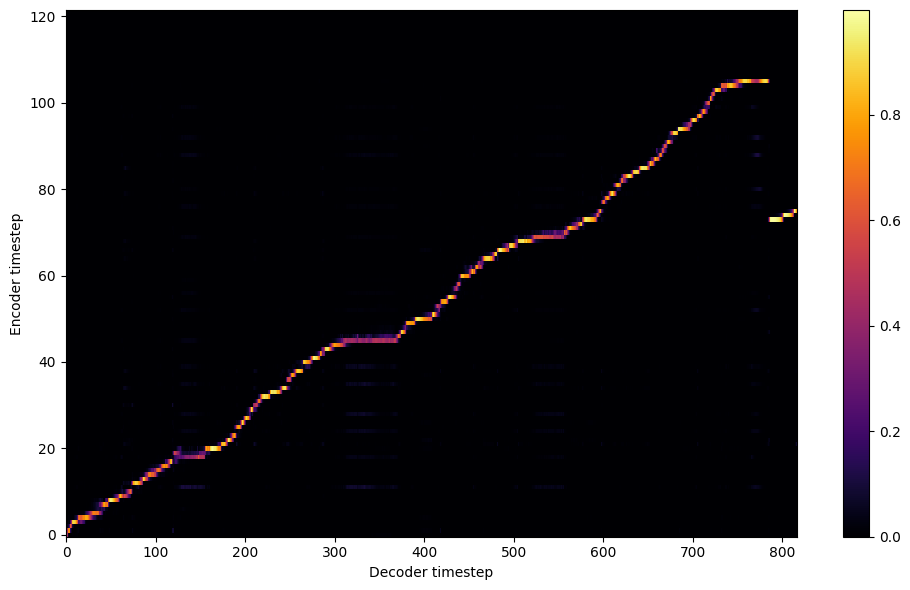

Saving model and optimizer state at iteration 8376 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 24 Iteration: 8376


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 24 Validation loss 8725:  0.247375  Time: 20.6m LR: 0.000010


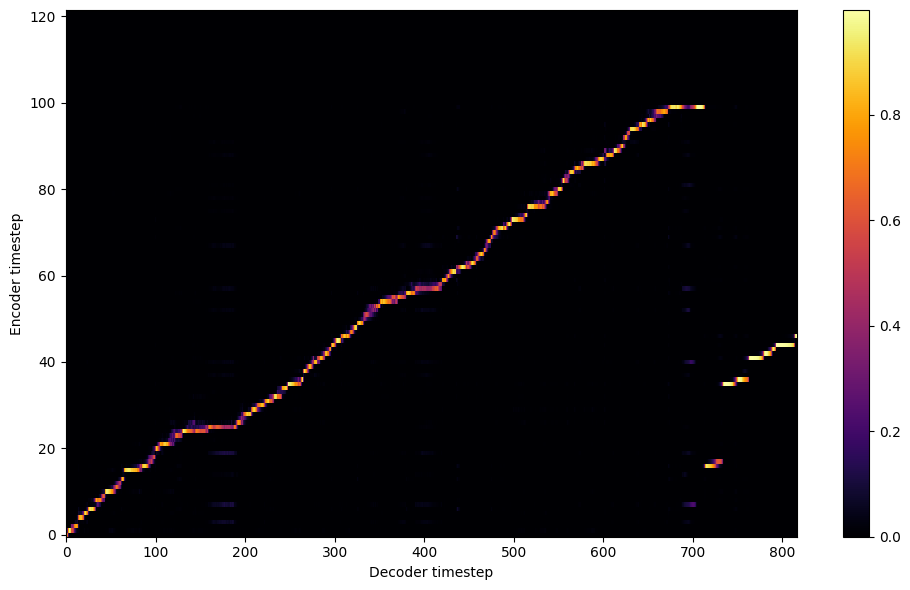

Saving model and optimizer state at iteration 8725 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 25 Iteration: 8725


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 25 Validation loss 9074:  0.247384  Time: 20.7m LR: 0.000010


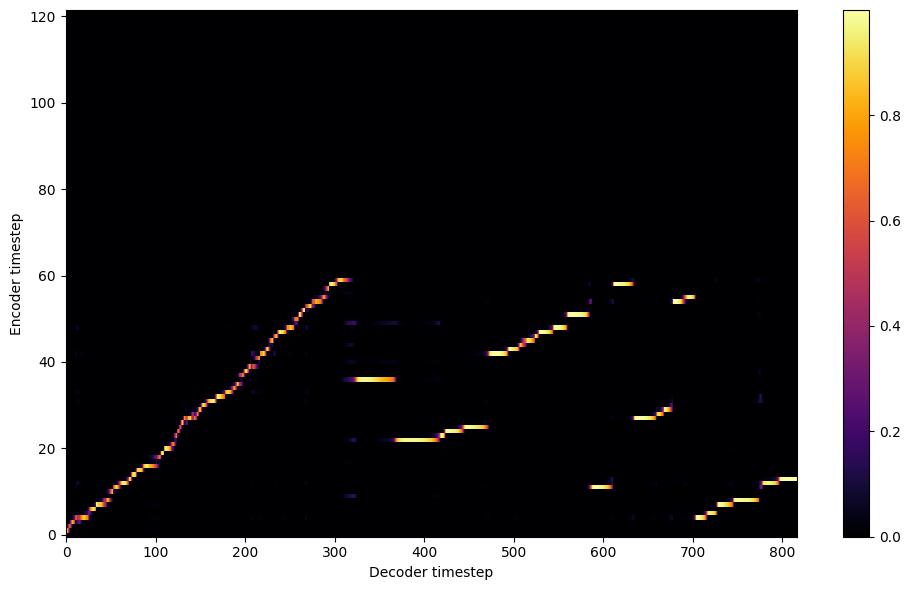

Saving model and optimizer state at iteration 9074 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 26 Iteration: 9074


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 26 Validation loss 9423:  0.247581  Time: 20.7m LR: 0.000010


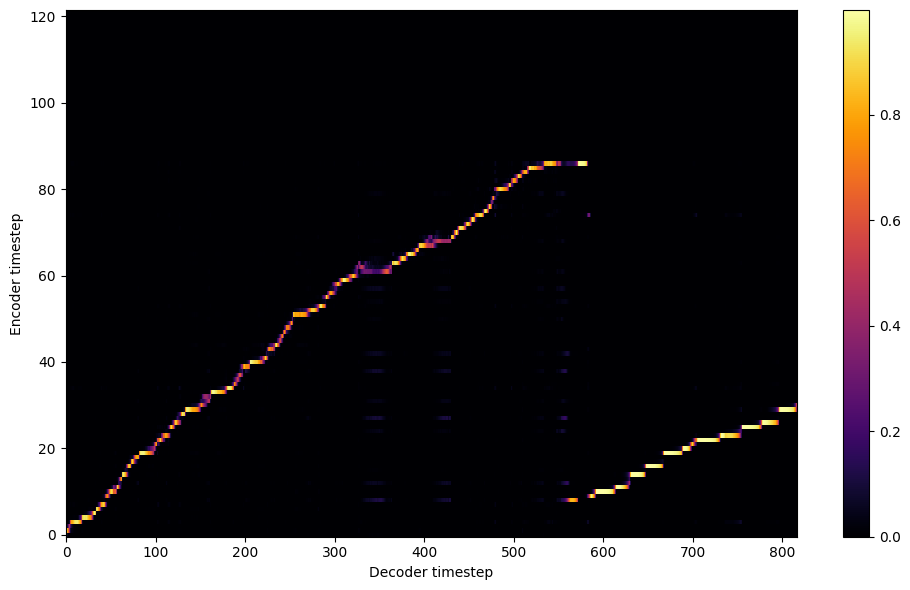

Saving model and optimizer state at iteration 9423 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 27 Iteration: 9423


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 27 Validation loss 9772:  0.247235  Time: 20.6m LR: 0.000010


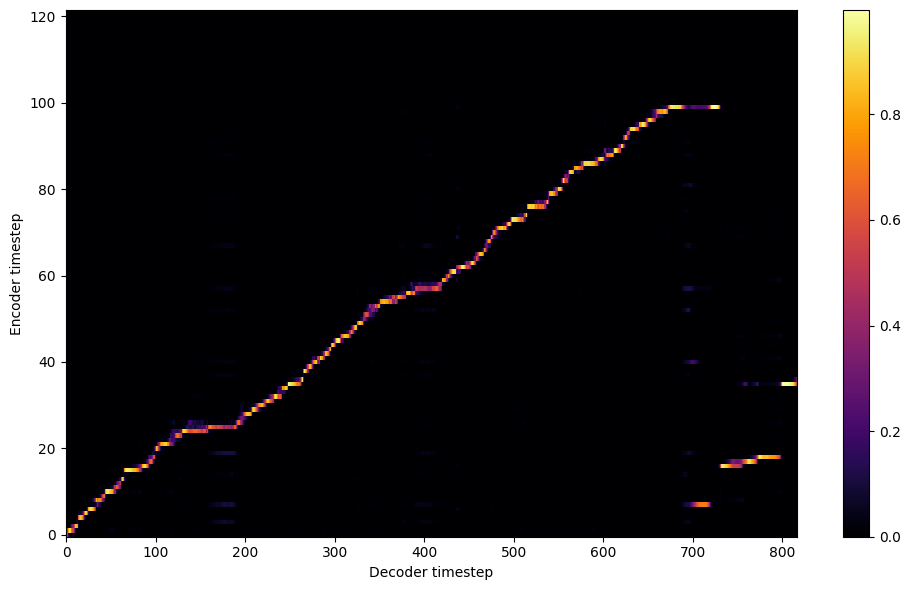

Saving model and optimizer state at iteration 9772 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 28 Iteration: 9772


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 28 Validation loss 10121:  0.247392  Time: 20.5m LR: 0.000010


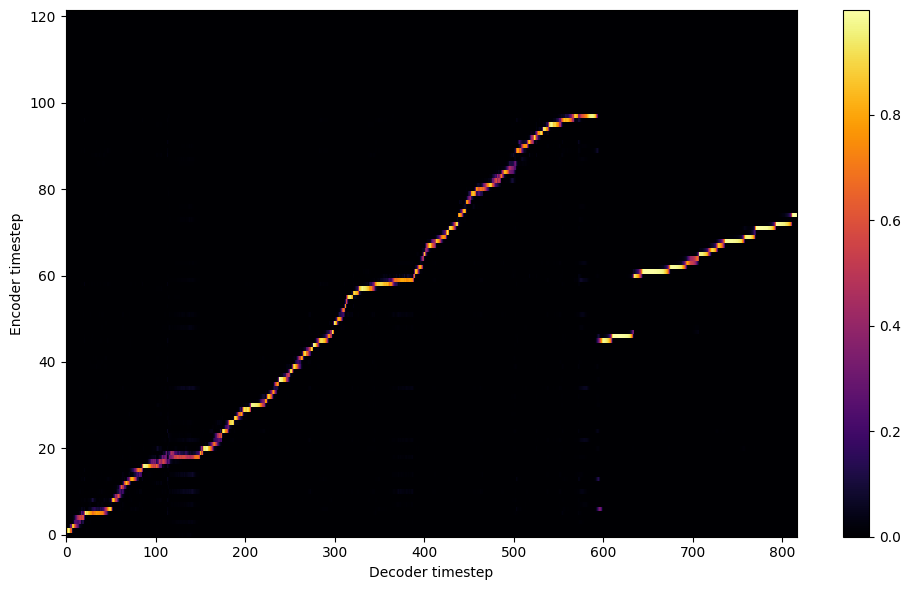

Saving model and optimizer state at iteration 10121 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 29 Iteration: 10121


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 29 Validation loss 10470:  0.247394  Time: 20.7m LR: 0.000010


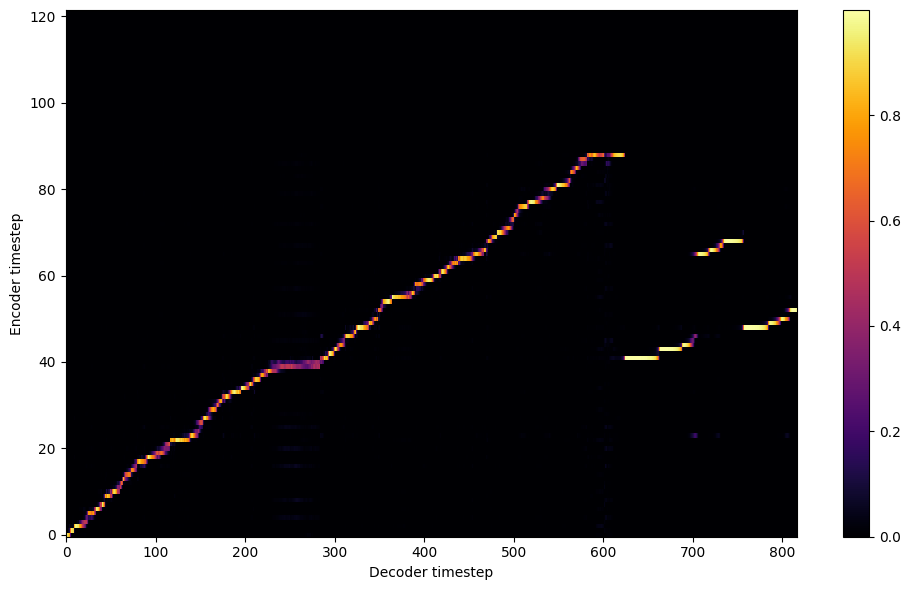

Saving model and optimizer state at iteration 10470 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 30 Iteration: 10470


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 30 Validation loss 10819:  0.247380  Time: 20.7m LR: 0.000010


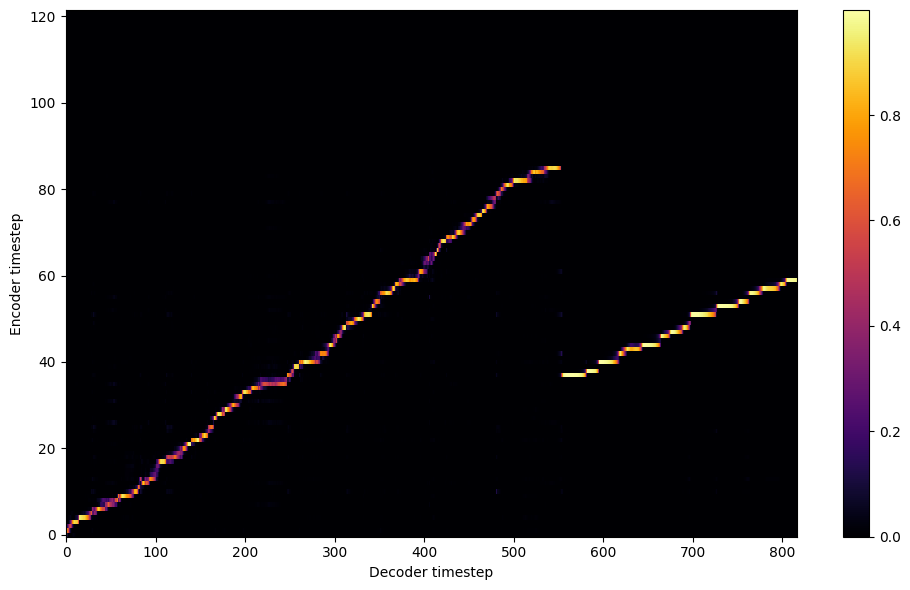

Saving model and optimizer state at iteration 10819 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 31 Iteration: 10819


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 31 Validation loss 11168:  0.247365  Time: 20.7m LR: 0.000010


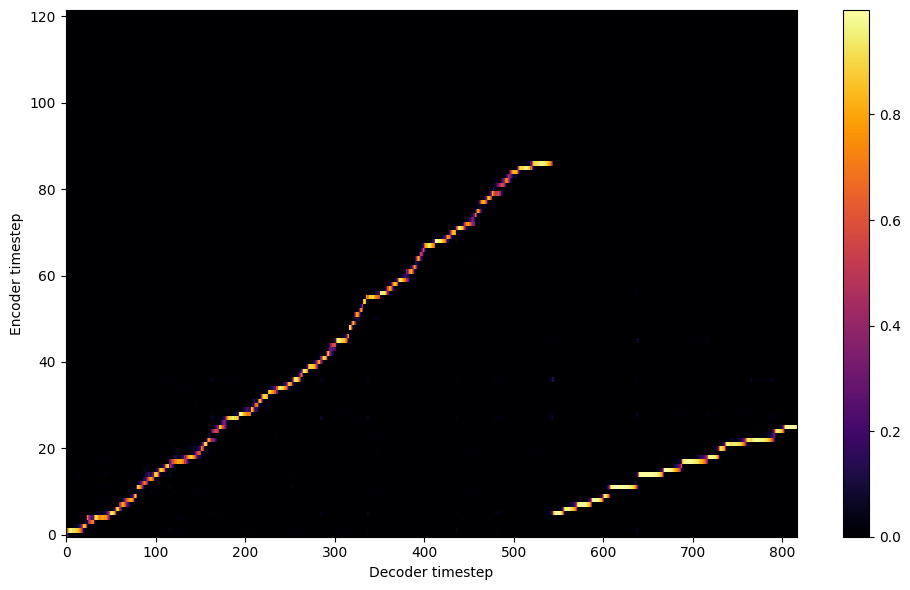

Saving model and optimizer state at iteration 11168 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 32 Iteration: 11168


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 32 Validation loss 11517:  0.247112  Time: 20.7m LR: 0.000010


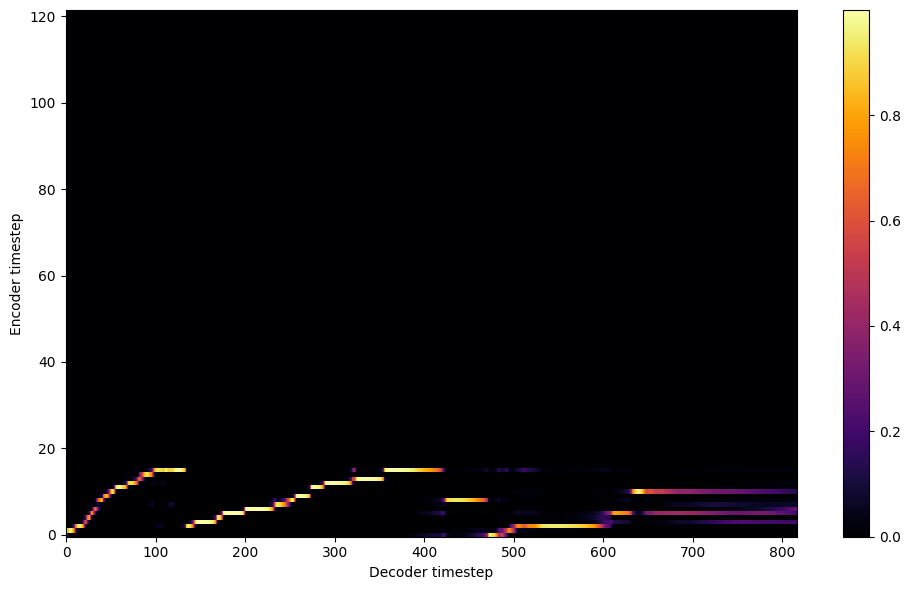

Saving model and optimizer state at iteration 11517 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 33 Iteration: 11517


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 33 Validation loss 11866:  0.247168  Time: 20.6m LR: 0.000010


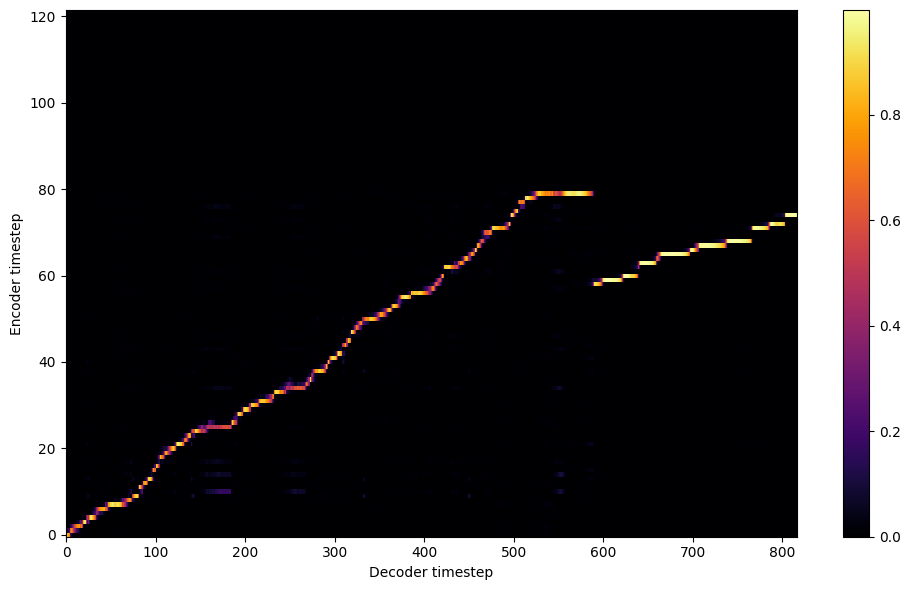

Saving model and optimizer state at iteration 11866 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 34 Iteration: 11866


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 34 Validation loss 12215:  0.247575  Time: 20.6m LR: 0.000010


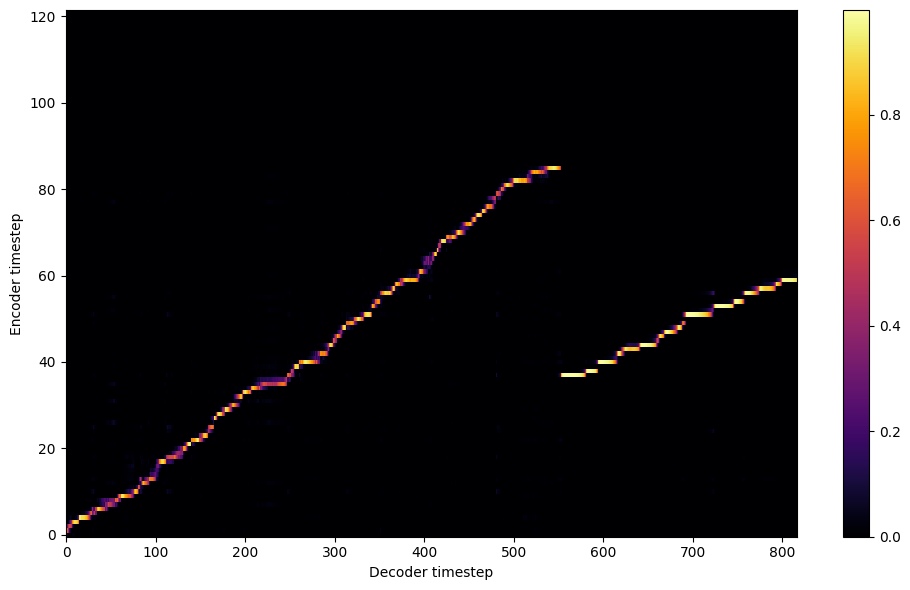

Saving model and optimizer state at iteration 12215 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 35 Iteration: 12215


  0%|          | 0/349 [00:00<?, ?it/s]

Epoch: 35 Validation loss 12564:  0.247308  Time: 20.6m LR: 0.000010


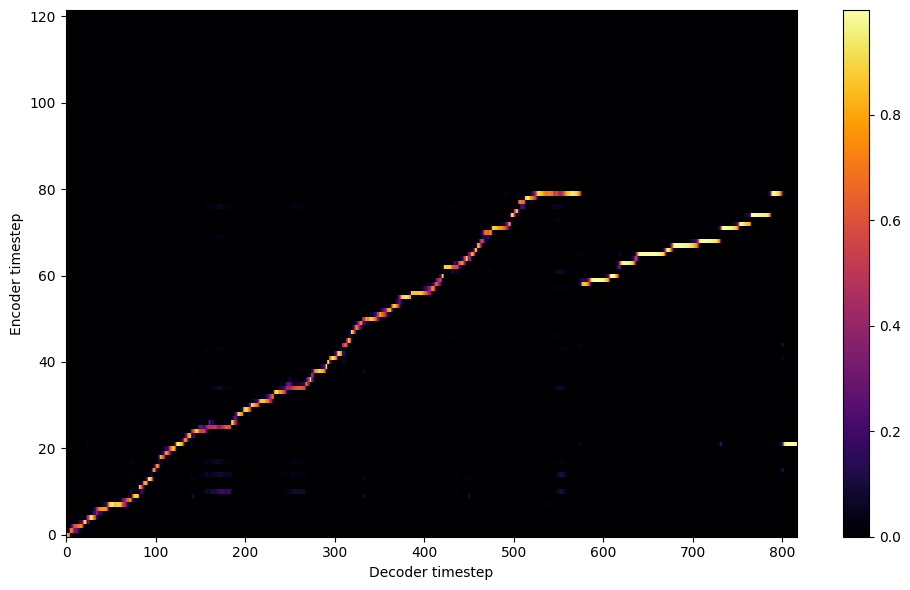

Saving model and optimizer state at iteration 12564 to /content/drive/MyDrive/colab/outdir/Text_To_Speech
Model Saved

Starting Epoch: 36 Iteration: 12564


  0%|          | 0/349 [00:00<?, ?it/s]

In [ ]:

save_interval =  1



backup_interval =  -1


print('FP16 Run:', hparams.fp16_run)
print('Dynamic Loss Scaling:', hparams.dynamic_loss_scaling)
print('Distributed Run:', hparams.distributed_run)
print('cuDNN Enabled:', hparams.cudnn_enabled)
print('cuDNN Benchmark:', hparams.cudnn_benchmark)
warm_start=False
%load_ext tensorboard
%tensorboard --logdir /content/TTS-TT2/logs

train(output_directory, log_directory, checkpoint_path,
      warm_start, n_gpus, rank, group_name, hparams, log_directory2,
      save_interval, backup_interval)